# High Risk Project

---


In this project, I develop an AI-powered assistant designed to serve as an extra set of expert eyes for clinicians.

Skin Lesion Classification — A deep learning model trained on a labeled skin lesion dataset to predict the type of lesion

Explainable AI with Grad-CAM — A heatmap overlay that highlights the regions of the image most influential in the model’s decision, helping clinicians verify and interpret results.

Vision Language Model (VLM) Explanations - A natural language description of the lesion’s visual features (e.g., “dark, irregular borders” or “scaly texture”).

This approach is not intended to replace dermatologists but to support and augment their expertise. It can aid in early detection by flagging suspicious lesions for further review.

Provide interpretable results that help clinicians learn and trust AI outputs.

In [ ]:
from google.colab import files
files.upload()  # Upload kaggle.json

In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000
!unzip -q skin-cancer-mnist-ham10000.zip -d skin_cancer_dataset


Dataset URL: https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000
License(s): CC-BY-NC-SA-4.0
 99% 5.14G/5.20G [01:16<00:03, 20.3MB/s]
100% 5.20G/5.20G [01:16<00:00, 73.2MB/s]


## Load Data and resize


---



In [ ]:
import os
from pathlib import Path
import pandas as pd

# Load metadata
base_path = Path("skin_cancer_dataset")
metadata_path = base_path / "HAM10000_metadata.csv"
df = pd.read_csv(metadata_path)

# 3 target classes
df = df[df["dx"].isin(["mel", "nv", "bkl"])].copy()
df["label"] = df["dx"]  # mel / nv / bkl

# Normalize ids
df["image_id"] = df["image_id"].str.strip().str.lower()

# Index image files from both folders
image_dirs = [
    base_path / "HAM10000_images_part_1",
    base_path / "HAM10000_images_part_2",
    base_path / "ham10000_images_part_1",
    base_path / "ham10000_images_part_2",
]
image_files = {}
for image_dir in image_dirs:
    if not image_dir.exists():
        continue
    for root, _, files in os.walk(image_dir):
        for file in files:
            if file.lower().endswith(".jpg"):
                image_id = file[:-4].strip().lower()
                image_files[image_id] = os.path.join(root, file)

df["image_path"] = df["image_id"].map(image_files)
df = df[df["image_path"].notnull()].copy()

print("Final image count:", len(df))
print("Sample image path:", df["image_path"].iloc[0])



Final image count: 8917
Sample image path: skin_cancer_dataset/ham10000_images_part_1/ISIC_0027419.jpg


In [ ]:
from PIL import Image
from tqdm import tqdm

output_root = Path("data/processed")
for label in df["label"].unique():
    os.makedirs(output_root / label, exist_ok=True)

for _, row in tqdm(df.iterrows(), total=len(df), desc="Saving resized images"):
    dst_path = output_root / row["label"] / f"{row['image_id']}.jpg"
    try:
        img = Image.open(row["image_path"]).convert("RGB")
        img = img.resize((224, 224))
        img.save(dst_path)
    except Exception as e:
        print(f"Skipping {row['image_id']} due to error: {e}")


Saving resized images: 100%|██████████| 8917/8917 [01:27<00:00, 101.39it/s]


## EDA - looking at data insights


---



,lesion_id,image_id,dx,dx_type,age,sex,localization,label,image_path
0,HAM_0000118,isic_0027419,bkl,histo,80.0,male,scalp,bkl,skin_cancer_dataset/ham10000_images_part_1/ISI...
1,HAM_0000118,isic_0025030,bkl,histo,80.0,male,scalp,bkl,skin_cancer_dataset/ham10000_images_part_1/ISI...
2,HAM_0002730,isic_0026769,bkl,histo,80.0,male,scalp,bkl,skin_cancer_dataset/ham10000_images_part_1/ISI...
3,HAM_0002730,isic_0025661,bkl,histo,80.0,male,scalp,bkl,skin_cancer_dataset/ham10000_images_part_1/ISI...
4,HAM_0001466,isic_0031633,bkl,histo,75.0,male,ear,bkl,skin_cancer_dataset/ham10000_images_part_2/ISI...


Rows: 8917

Missing values per column:
 lesion_id        0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
label            0
image_path       0
dtype: int64


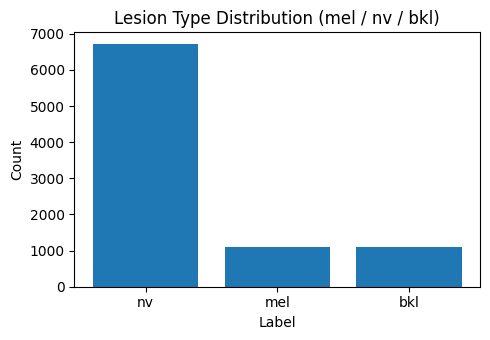

nv: 6705 (75.2%)
mel: 1113 (12.5%)
bkl: 1099 (12.3%)


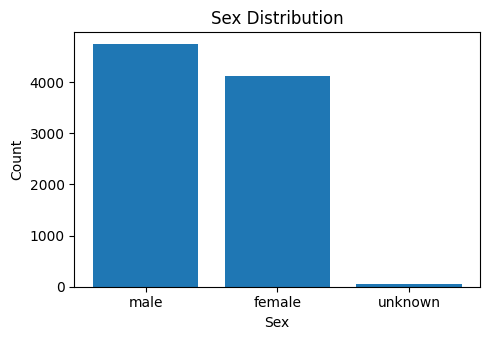

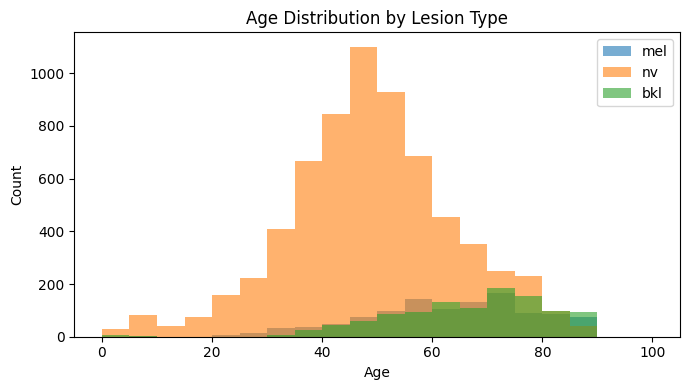

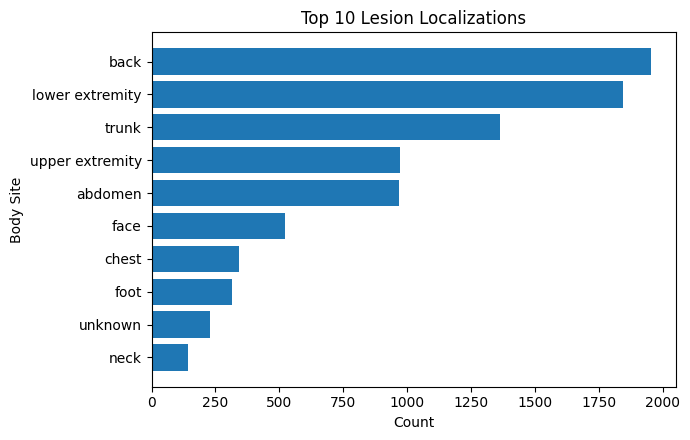

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

display(df.head())
print("Rows:", len(df))
print("\nMissing values per column:\n", df.isna().sum())

counts = df['label'].value_counts()
plt.figure(figsize=(5,3.5))
plt.bar(counts.index, counts.values)
plt.title('Lesion Type Distribution (mel / nv / bkl)')
plt.xlabel('Label'); plt.ylabel('Count'); plt.tight_layout(); plt.show()

for k,v in counts.items():
    print(f"{k}: {v} ({v/len(df):.1%})")

# Sex
sex = df['sex'].fillna('unknown').str.lower().value_counts()
plt.figure(figsize=(5,3.5))
plt.bar(sex.index, sex.values)
plt.title('Sex Distribution'); plt.xlabel('Sex'); plt.ylabel('Count')
plt.tight_layout(); plt.show()

# Age by class
bins = np.arange(0, 101, 5)
plt.figure(figsize=(7,4))
for cls in ['mel','nv','bkl']:
    plt.hist(df.loc[df['label']==cls, 'age'].dropna(), bins=bins, alpha=0.6, label=cls, stacked=True)
plt.title('Age Distribution by Lesion Type'); plt.xlabel('Age'); plt.ylabel('Count')
plt.legend(); plt.tight_layout(); plt.show()

loc = df['localization'].fillna('unknown').value_counts().head(10)
plt.figure(figsize=(7,4.5))
plt.barh(loc.index.astype(str), loc.values)
plt.title('Top 10 Lesion Localizations'); plt.xlabel('Count'); plt.ylabel('Body Site')
plt.gca().invert_yaxis()
plt.tight_layout(); plt.show()


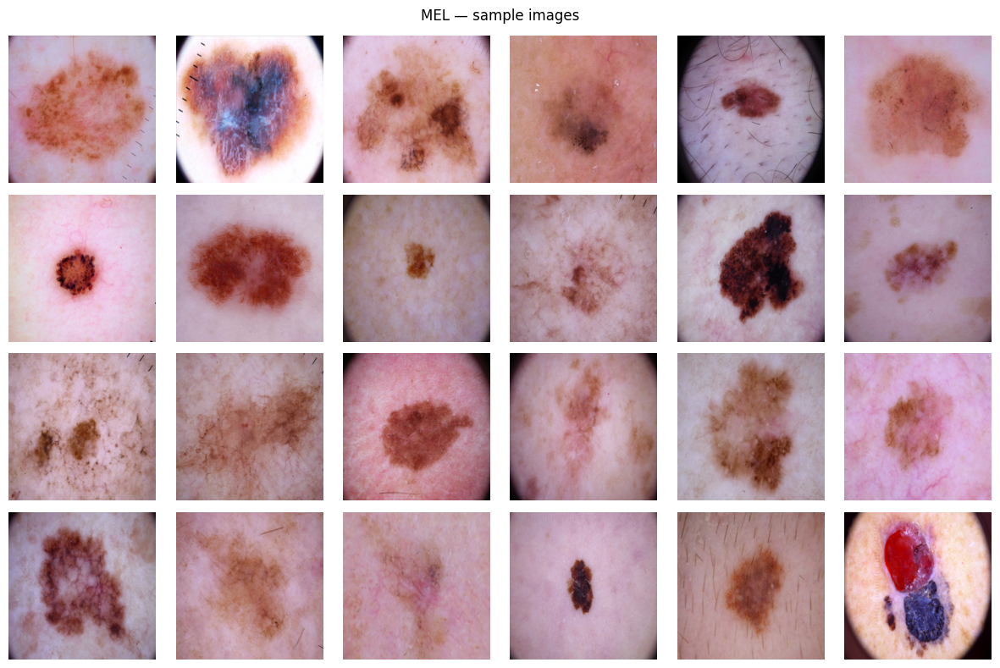

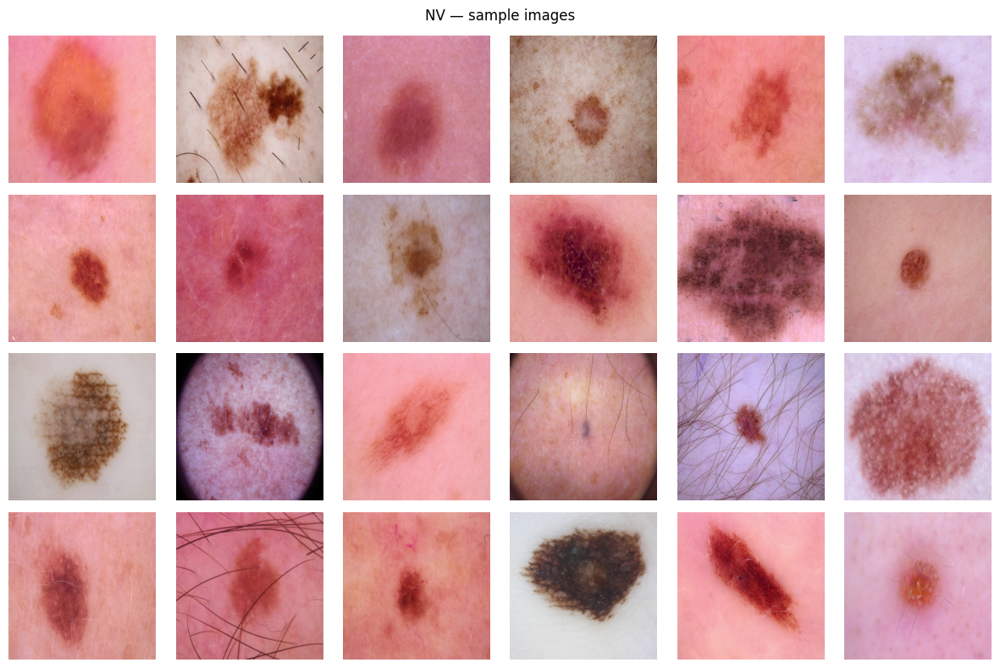

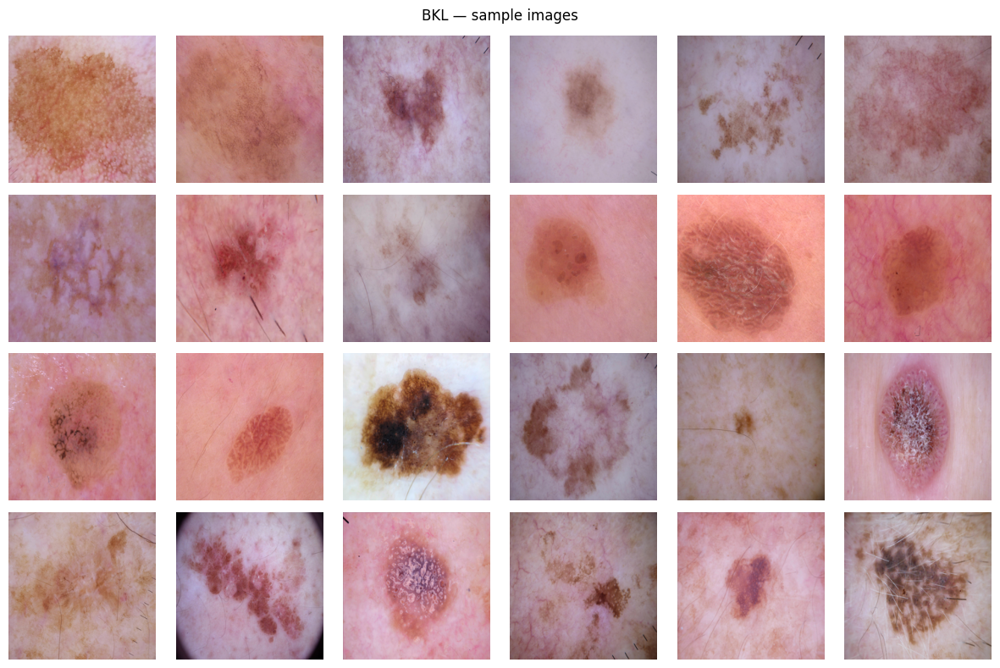

In [ ]:
import random
from PIL import Image

def show_grid(paths, n=12, size=(224,224), title='Samples'):
    cols = 6
    rows = int(np.ceil(n/cols))
    plt.figure(figsize=(cols*2, rows*2))
    for i, p in enumerate(paths[:n]):
        try:
            img = Image.open(p).convert("RGB").resize(size)
            plt.subplot(rows, cols, i+1)
            plt.imshow(img); plt.axis('off')
        except: pass
    plt.suptitle(title)
    plt.tight_layout(); plt.show()

for c in ['mel','nv','bkl']:
    paths = df[df['label']==c]['image_path'].sample(min(24, (df['label']==c).sum()), random_state=42).tolist()
    show_grid(paths, n=min(24,len(paths)), title=f'{c.upper()} — sample images')


## Train and Evaluation
---------------------------------------------------------------
We fine‑tune a MobileNetV2 classifier on the processed images.
Backbone is frozen and only the final classifier layer is trained.


After experimenting with various hyperparameter configurations, including learning rates, batch sizes, and augmentation strategies, the final model achieved approximately 80% validation accuracy.

In [ ]:
import os
import random
import numpy as np
import pandas as pd
from pathlib import Path

import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import StratifiedShuffleSplit

In [ ]:
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DATA_DIR = Path("data/processed")
SPLIT_DIR = Path("data/splits")
BATCH_SIZE = 32
EPOCHS = 10
LEARNING_RATE = 1e-4
NUM_CLASSES = 3
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)


Using device: cuda


In [ ]:
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

train_tfms = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.RandomResizedCrop(224, scale=(0.9, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

val_tfms = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])


In [ ]:
class ImageDFDataset(Dataset):
    def __init__(self, df, tfm=None, class_to_idx=None):
        self.df = df.reset_index(drop=True)
        self.tfm = tfm
        self.class_to_idx = class_to_idx or {c:i for i,c in enumerate(sorted(self.df['label'].unique()))}
        self.idx_to_class = {v:k for k,v in self.class_to_idx.items()}

    def __len__(self): return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        img = Image.open(row['image_path']).convert("RGB")
        if self.tfm: img = self.tfm(img)
        y = self.class_to_idx[row['label']]
        return img, y

# Build splits

def build_df_from_folders(root: Path):
    rows = []
    for cls in sorted([d.name for d in root.iterdir() if d.is_dir()]):
        for p in (root/cls).glob("*.jpg"):
            rows.append({"image_path": str(p), "label": cls})
    return pd.DataFrame(rows)

if (SPLIT_DIR/"train.csv").exists() and (SPLIT_DIR/"val.csv").exists():
    df_train = pd.read_csv(SPLIT_DIR/"train.csv")
    df_val   = pd.read_csv(SPLIT_DIR/"val.csv")

    if not df_train['image_path'].iloc[0].startswith(str(DATA_DIR)):
        df_train['image_path'] = df_train['image_path'].apply(lambda p: p if os.path.isabs(p) else str(Path(p)))
        df_val['image_path']   = df_val['image_path'].apply(lambda p: p if os.path.isabs(p) else str(Path(p)))
else:
    df_all = build_df_from_folders(DATA_DIR)
    splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=SEED)
    train_idx, val_idx = next(splitter.split(df_all, df_all['label']))
    df_train = df_all.iloc[train_idx].copy()
    df_val   = df_all.iloc[val_idx].copy()

class_names = sorted(df_train['label'].unique())
class_to_idx = {c:i for i,c in enumerate(class_names)}
print("Classes:", class_names)

train_ds = ImageDFDataset(df_train, tfm=train_tfms, class_to_idx=class_to_idx)
val_ds   = ImageDFDataset(df_val,   tfm=val_tfms,   class_to_idx=class_to_idx)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

weights = models.MobileNet_V2_Weights.IMAGENET1K_V1
model = models.mobilenet_v2(weights=weights)
for p in model.features.parameters():
    p.requires_grad = False
model.classifier[-1] = nn.Linear(model.last_channel, NUM_CLASSES)
model = model.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.5, verbose=True)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


Classes: ['bkl', 'mel', 'nv']


100%|██████████| 13.6M/13.6M [00:00<00:00, 176MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [ ]:
best_val_loss = float("inf")
train_losses, val_losses, val_accs = [], [], []

for epoch in range(1, EPOCHS+1):
    model.train()
    running_loss = 0.0
    for x, y in train_loader:
        x, y = x.to(DEVICE), y.to(DEVICE)
        optimizer.zero_grad()
        logits = model(x)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    avg_train = running_loss / max(1, len(train_loader))
    train_losses.append(avg_train)

    # Validation
    model.eval()
    vloss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for x, y in val_loader:
            x, y = x.to(DEVICE), y.to(DEVICE)
            logits = model(x)
            loss = criterion(logits, y)
            vloss += loss.item()
            preds = torch.argmax(logits, dim=1)
            correct += (preds == y).sum().item()
            total += y.size(0)

    avg_val = vloss / max(1, len(val_loader))
    acc = correct / max(1, total)
    val_losses.append(avg_val)
    val_accs.append(acc)
    scheduler.step(avg_val)

    print(f"Epoch {epoch:02d}/{EPOCHS}  Train Loss: {avg_train:.4f}  Val Loss: {avg_val:.4f}  Val Acc: {acc:.4f}")

    # Save best
    if avg_val < best_val_loss:
        best_val_loss = avg_val
        torch.save(model.state_dict(), "best_mobilenet_v2.pt")

Epoch 01/10  Train Loss: 0.6691  Val Loss: 0.6092  Val Acc: 0.7534
Epoch 02/10  Train Loss: 0.5619  Val Loss: 0.5445  Val Acc: 0.7870
Epoch 03/10  Train Loss: 0.5261  Val Loss: 0.5210  Val Acc: 0.7926
Epoch 04/10  Train Loss: 0.5194  Val Loss: 0.5078  Val Acc: 0.8004
Epoch 05/10  Train Loss: 0.5054  Val Loss: 0.5008  Val Acc: 0.8021
Epoch 06/10  Train Loss: 0.4952  Val Loss: 0.4913  Val Acc: 0.7993
Epoch 07/10  Train Loss: 0.4932  Val Loss: 0.5089  Val Acc: 0.7943
Epoch 08/10  Train Loss: 0.4859  Val Loss: 0.4806  Val Acc: 0.8077
Epoch 09/10  Train Loss: 0.4821  Val Loss: 0.4730  Val Acc: 0.8089
Epoch 10/10  Train Loss: 0.4800  Val Loss: 0.4763  Val Acc: 0.8094


## Evalaution of model

---------------------------------------------------



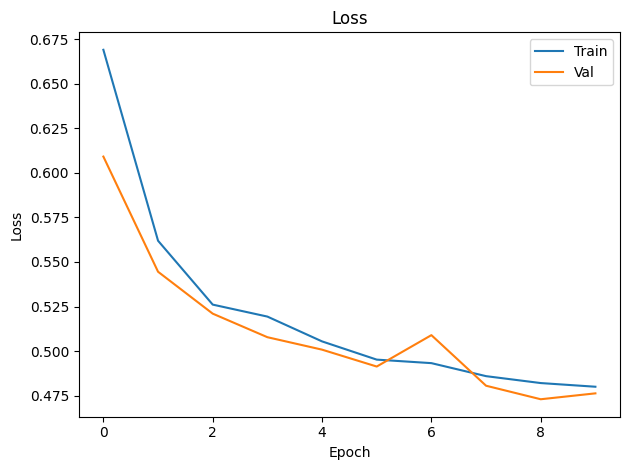

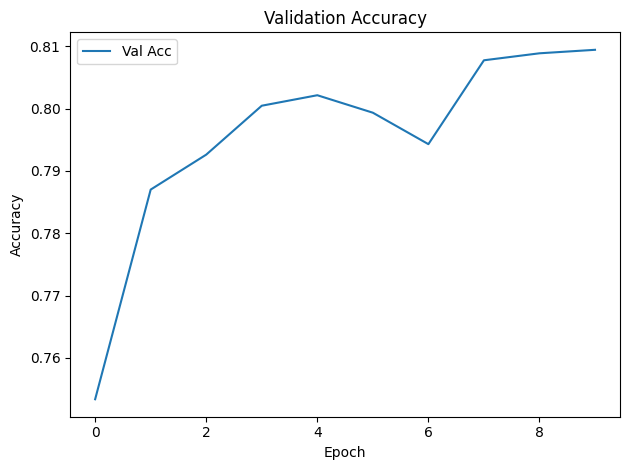


Classification Report:
              precision    recall  f1-score   support

         bkl     0.6257    0.4864    0.5473       220
         mel     0.5676    0.1883    0.2828       223
          nv     0.8408    0.9650    0.8986      1341

    accuracy                         0.8089      1784
   macro avg     0.6780    0.5466    0.5763      1784
weighted avg     0.7801    0.8089    0.7783      1784



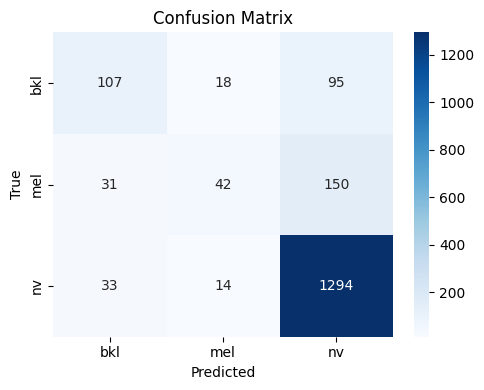

In [ ]:
plt.figure()
plt.plot(train_losses, label="Train")
plt.plot(val_losses, label="Val")
plt.title("Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend(); plt.tight_layout(); plt.show()

plt.figure()
plt.plot(val_accs, label="Val Acc")
plt.title("Validation Accuracy")
plt.xlabel("Epoch"); plt.ylabel("Accuracy"); plt.legend(); plt.tight_layout(); plt.show()
# Load best weights before reporting
model.load_state_dict(torch.load("best_mobilenet_v2.pt", map_location=DEVICE))
model.eval()

y_true, y_pred = [], []
with torch.no_grad():
    for x, y in val_loader:
        x = x.to(DEVICE)
        logits = model(x)
        preds = torch.argmax(logits, dim=1).cpu().numpy()
        y_pred.extend(preds.tolist())
        y_true.extend(y.numpy().tolist())

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

## Hyperparamter Tuning

In [ ]:
best_macro_recall = 0.0
best_epoch = -1
best_path = "best_by_macro_recall.pt"

train_losses, val_losses, val_accs = [], [], []

for epoch in range(1, EPOCHS+1):
    model.train()
    running = 0.0
    for x,y in train_loader:
        x,y = x.to(DEVICE), y.to(DEVICE)
        optimizer.zero_grad(set_to_none=True)
        logits = model(x)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()
        running += loss.item()

    train_loss = running / max(1, len(train_loader))

    model.eval()
    vloss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for x,y in val_loader:
            x,y = x.to(DEVICE), y.to(DEVICE)
            logits = model(x)
            loss = criterion(logits, y)
            vloss += loss.item()
            preds = torch.argmax(logits, dim=1)
            correct += (preds == y).sum().item()
            total += y.size(0)
    val_loss = vloss / max(1, len(val_loader))
    val_acc = correct / max(1, total)
    scheduler.step(val_loss)


    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    print(f"\nEpoch {epoch:02d}/{EPOCHS} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    macro_recall, per_cls_rec = eval_metrics(model, val_loader)
    print(f"Macro recall: {macro_recall:.3f} | per-class recall: {per_cls_rec}")

    if macro_recall > best_macro_recall:
        best_macro_recall = macro_recall
        best_epoch = epoch
        save_checkpoint(best_path, epoch, model, optimizer, best_macro_recall, class_names)
        print(f"New best macro recall {best_macro_recall:.3f} at epoch {best_epoch} saved {best_path}")

print(f"Best macro recall observed: {best_macro_recall:.3f} at epoch {best_epoch}")


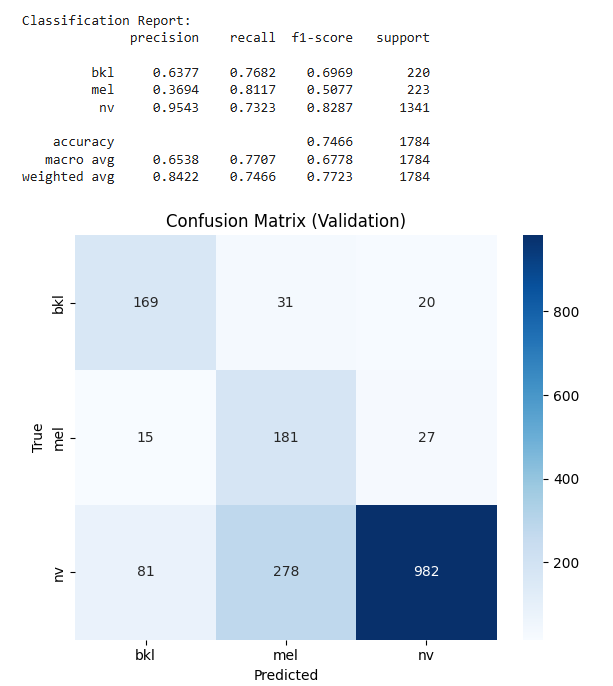

In [ ]:
import os
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import cv2


In [ ]:
CKPT = "best_mobilenet_v2.pt"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

try:
    class_names = dataset.classes
except NameError:
    class_names = sorted(df['label'].unique().tolist())

num_classes = len(class_names)
class_to_idx = {c:i for i,c in enumerate(class_names)}
idx_to_class = {i:c for c,i in class_to_idx.items()}

model = models.mobilenet_v2(weights=None)
model.classifier[1] = nn.Linear(model.last_channel, num_classes)

state = torch.load(CKPT, map_location=DEVICE)
model.load_state_dict(state)
model.to(DEVICE).eval()

print("Classes:", class_names)
print("Checkpoint loaded on:", DEVICE)


Classes: ['bkl', 'mel', 'nv']
Checkpoint loaded on: cuda


In [ ]:
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

preprocess = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])


In [ ]:
target_layer = model.features[-1][0]

activations = []
gradients = []

def fwd_hook(module, inp, out):
    activations.clear()
    activations.append(out.detach())

def bwd_hook(module, grad_in, grad_out):
    gradients.clear()
    gradients.append(grad_out[0].detach())

fwd_handle = target_layer.register_forward_hook(fwd_hook)
bwd_handle = target_layer.register_full_backward_hook(bwd_hook)

print("Hooks registered on:", target_layer)


Hooks registered on: Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [ ]:
def generate_gradcam(img_path, class_idx=None, return_heatmap=False):
    pil = Image.open(img_path).convert("RGB")
    x = preprocess(pil).unsqueeze(0).to(DEVICE)

    model.zero_grad(set_to_none=True)
    logits = model(x)
    pred_idx = int(logits.argmax(dim=1).item())
    target = class_idx if class_idx is not None else pred_idx

    score = logits[:, target].sum()
    score.backward()

    A = activations[0]
    G = gradients[0]
    weights = G.mean(dim=(2,3), keepdim=True)
    cam = (weights * A).sum(dim=1, keepdim=True)
    cam = torch.relu(cam).squeeze().cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() + 1e-8)


    H, W = pil.height, pil.width
    cam_resized = cv2.resize(cam, (W, H), interpolation=cv2.INTER_LINEAR)
    heatmap = cv2.applyColorMap((cam_resized*255).astype(np.uint8), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    img_np = np.array(pil)

    overlay = cv2.addWeighted(heatmap, 0.4, img_np, 0.6, 0)

    if return_heatmap:
        return overlay, heatmap, pred_idx, target
    return overlay, pred_idx, target



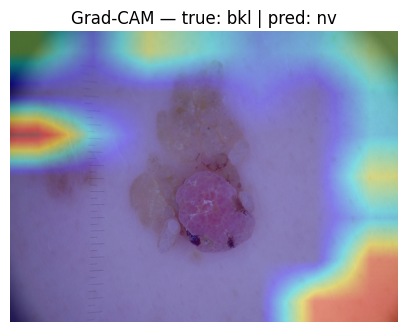

In [ ]:
i = 10
sample_path = df["image_path"].iloc[i]
true_label = df["label"].iloc[i]
target_idx = class_to_idx.get(true_label, None)

overlay, pred_idx, used_idx = generate_gradcam(sample_path, class_idx=target_idx)

plt.figure(figsize=(5,5))
plt.imshow(overlay)
plt.axis("off")
title = f"Grad-CAM — true: {true_label} | pred: {idx_to_class[pred_idx]}"
plt.title(title)
plt.show()


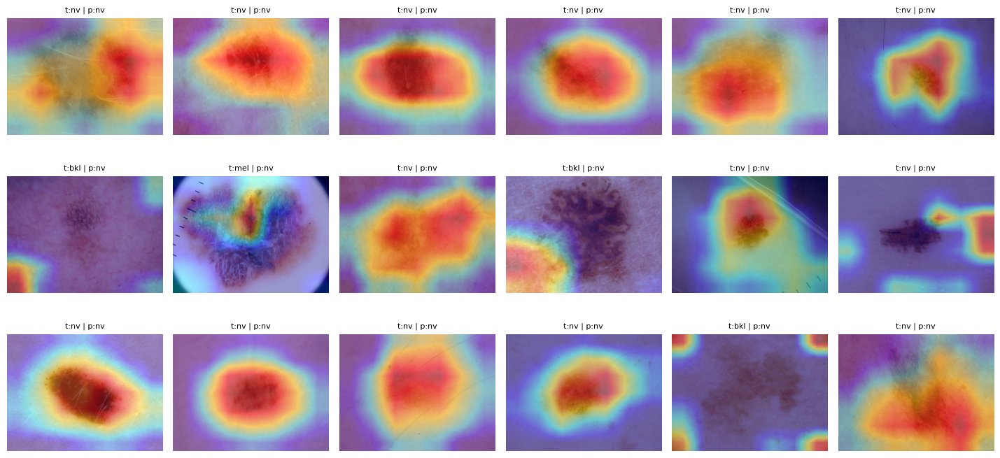

In [ ]:
def show_gradcam_grid(df_subset, n=12):
    n = min(n, len(df_subset))
    cols = 6
    rows = int(np.ceil(n/cols))
    plt.figure(figsize=(cols*2.4, rows*2.4))
    for j in range(n):
        p = df_subset["image_path"].iloc[j]
        t = df_subset["label"].iloc[j]
        t_idx = class_to_idx.get(t, None)
        try:
            overlay, pred_idx, used_idx = generate_gradcam(p, class_idx=t_idx)
            ax = plt.subplot(rows, cols, j+1)
            ax.imshow(overlay); ax.axis("off")
            ax.set_title(f"t:{t} | p:{idx_to_class[pred_idx]}", fontsize=8)
        except Exception as e:
            print(f"Error on {p}: {e}")
    plt.tight_layout(); plt.show()

df_subset = df.sample(18, random_state=42).reset_index(drop=True)
show_gradcam_grid(df_subset, n=18)


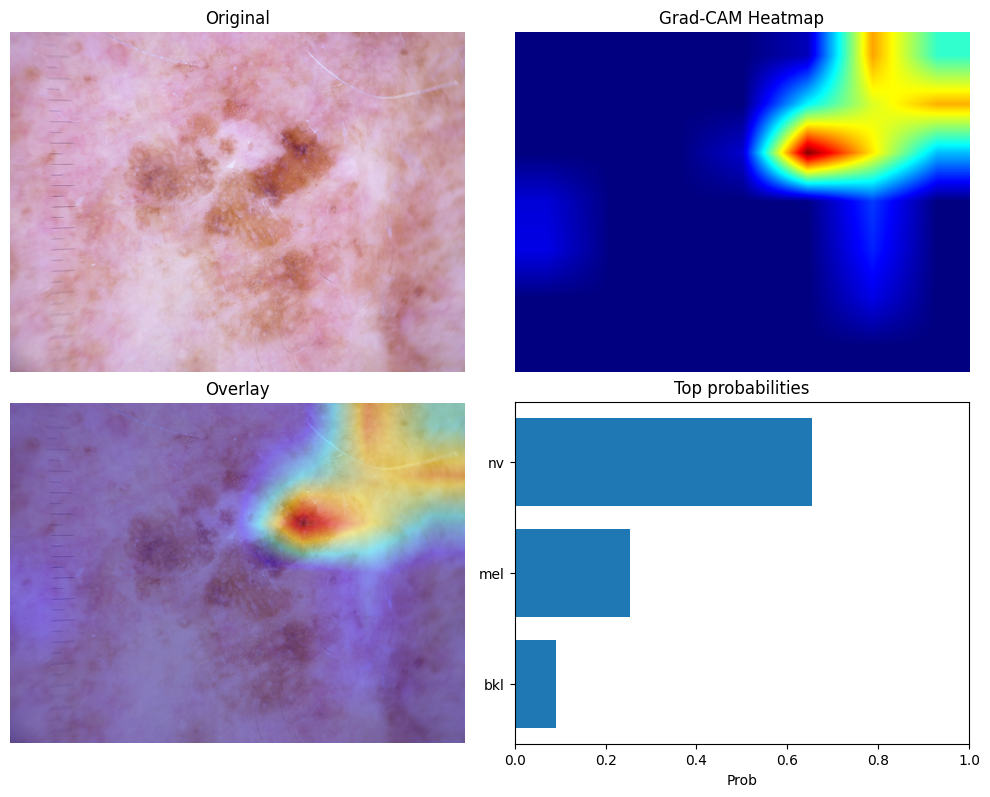

In [ ]:
import torch.nn.functional as F

def show_panel(img_path, class_idx=None, topk=3):
    pil = Image.open(img_path).convert("RGB")
    x = preprocess(pil).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        logits = model(x)
        probs = F.softmax(logits, dim=1).cpu().numpy()[0]
        pred_idx = int(np.argmax(probs))

    overlay, heat, pred_idx_cam, used_idx = generate_gradcam(img_path, class_idx=class_idx, return_heatmap=True)

    order = np.argsort(probs)[::-1][:topk]
    labels = [idx_to_class[i] for i in order]
    values = probs[order]

    fig = plt.figure(figsize=(10,8))
    gs = fig.add_gridspec(2, 2)

    ax0 = fig.add_subplot(gs[0,0]); ax0.imshow(pil); ax0.axis("off"); ax0.set_title("Original")
    ax1 = fig.add_subplot(gs[0,1]); ax1.imshow(heat); ax1.axis("off"); ax1.set_title("Grad-CAM Heatmap")
    ax2 = fig.add_subplot(gs[1,0]); ax2.imshow(overlay); ax2.axis("off"); ax2.set_title("Overlay")
    ax3 = fig.add_subplot(gs[1,1]); ax3.barh(labels[::-1], values[::-1]); ax3.set_xlim(0,1.0)
    ax3.set_title("Top probabilities"); ax3.set_xlabel("Prob")
    plt.tight_layout()
    plt.show()

show_panel(df['image_path'].iloc[0], class_idx=None, topk=3)


/tmp/ipython-input-3822915303.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(); plt.show()


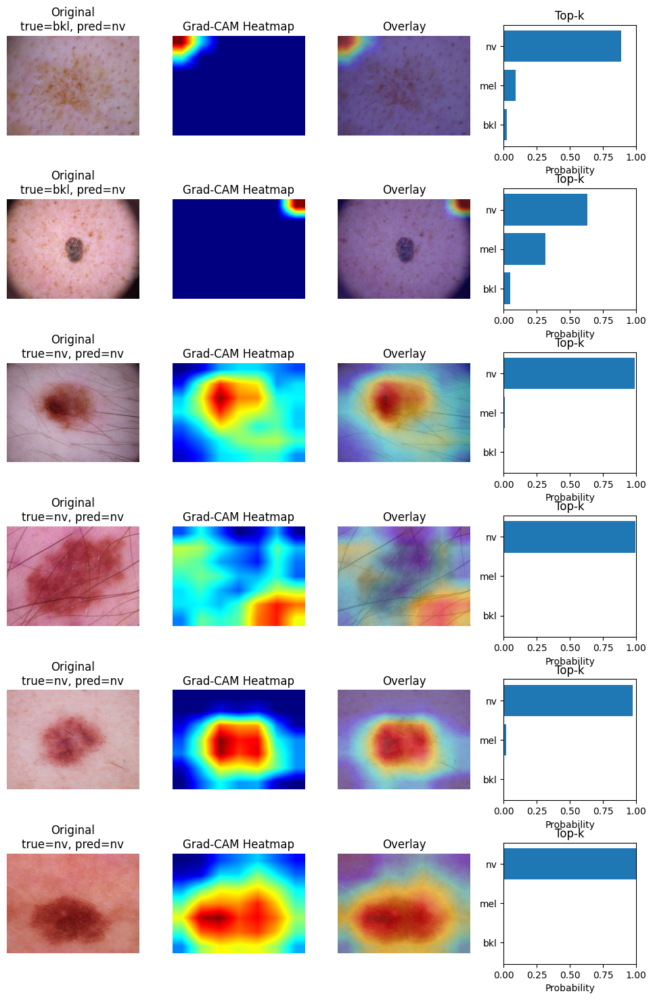

In [ ]:
import matplotlib.pyplot as plt
import torch.nn.functional as F

def show_multi_panels(df_subset, use_true_class=False, topk=3, max_rows=6):
    """
    Shows a grid with one row per image:
      Col 1: Original
      Col 2: Grad-CAM Heatmap
      Col 3: Overlay
      Col 4: Top-k probabilities bar chart
    """
    df_subset = df_subset.reset_index(drop=True)
    n = min(len(df_subset), max_rows)
    fig = plt.figure(figsize=(12, 3.0*n))
    gs = fig.add_gridspec(n, 4, wspace=0.25, hspace=0.35)

    for i in range(n):
        img_path = df_subset.loc[i, "image_path"]
        true_label = df_subset.loc[i, "label"]
        class_idx = class_to_idx[true_label] if use_true_class else None

        pil = Image.open(img_path).convert("RGB")
        x = preprocess(pil).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            logits = model(x)
            probs = F.softmax(logits, dim=1).cpu().numpy()[0]
            pred_idx = int(np.argmax(probs))

        overlay, heatmap, _, _ = generate_gradcam(img_path, class_idx=class_idx, return_heatmap=True)

        order = np.argsort(probs)[::-1][:topk]
        labels = [idx_to_class[j] for j in order]
        values = probs[order]


        ax0 = fig.add_subplot(gs[i, 0]); ax0.imshow(pil); ax0.axis("off")
        ax0.set_title(f"Original\ntrue={true_label}, pred={idx_to_class[pred_idx]}")

        ax1 = fig.add_subplot(gs[i, 1]); ax1.imshow(heatmap); ax1.axis("off")
        ax1.set_title("Grad-CAM Heatmap")

        ax2 = fig.add_subplot(gs[i, 2]); ax2.imshow(overlay); ax2.axis("off")
        ax2.set_title("Overlay")

        ax3 = fig.add_subplot(gs[i, 3])
        ax3.barh(labels[::-1], values[::-1])
        ax3.set_xlim(0, 1.0); ax3.set_xlabel("Probability")
        ax3.set_title("Top-k")

    plt.tight_layout(); plt.show()

df_subset = df.sample(6, random_state=7)
show_multi_panels(df_subset, use_true_class=True, topk=3, max_rows=6)


## VLM

In [ ]:
!pip -q install transformers==4.44.2 accelerate timm sentencepiece open_clip_torch==2.24.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 120.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 66.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 89.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 86.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/

In [ ]:
import torch
from transformers import InstructBlipProcessor, InstructBlipForConditionalGeneration

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IB_NAME = "Salesforce/instructblip-flan-t5-xl"

ib_processor = InstructBlipProcessor.from_pretrained(IB_NAME)
ib_model = InstructBlipForConditionalGeneration.from_pretrained(
    IB_NAME,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32
).to(DEVICE).eval()

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/439 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/43.0 [00:00<?, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

processor_config.json:   0%|          | 0.00/75.0 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/21.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/833 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/6.11G [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/9.98G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/168 [00:00<?, ?B/s]

In [ ]:
PROMPTS = {
  "global": "You are a expert in examning images of lesions. Please provide, one clinical sentence. State symmetry (symmetric/asymmetric), border (regular/irregular), color (single/multiple), texture (flat/raised, scaly/smooth). No diagnosis.",
  "roi":    "Focus only on the lesion. One clinical sentence stating symmetry, border, color distribution, diameter in millimeters if visible, and texture. No diagnosis.",
  "focused":"With background dimmed, one sentence describing symmetry, border, color distribution, texture, and any visible structures (dots, streaks, network). No diagnosis."
}

def vlm_describe(pil_image, prompt=PROMPTS, max_new_tokens=64):
    inputs = ib_processor(images=pil_image, text=prompt, return_tensors="pt").to(DEVICE)
    with torch.no_grad():
        out = ib_model.generate(
            **inputs,
            max_new_tokens=max_new_tokens,
            min_new_tokens=12,
            num_beams=4,
            no_repeat_ngram_size=3,
            length_penalty=0.2,
            do_sample=False
        )
    text = ib_processor.tokenizer.decode(out[0], skip_special_tokens=True).strip()

    lowers = text.lower()
    if lowers.startswith("describe ") or lowers.startswith("the prompt"):

        parts = text.split(".")
        text = ".".join(parts[1:]).strip()

    if not text.lower().startswith("the image shows"):
        text = "The image shows " + text[0].lower() + text[1:]
    return text


In [ ]:
import numpy as np, cv2
from PIL import Image

def cam_from_generate_gradcam(img_path, class_idx=None):

    _ = generate_gradcam(img_path, class_idx=class_idx, return_heatmap=True)
    pil = Image.open(img_path).convert("RGB")

    A = activations[0]; G = gradients[0]
    weights = G.mean(dim=(2,3), keepdim=True)
    cam = (weights * A).sum(dim=1, keepdim=True).relu().squeeze().cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() + 1e-8)
    cam = cv2.resize(cam, (pil.width, pil.height))
    return cam, pil

def cam_to_roi(cam, pil, thresh=0.4, pad=12):
    h, w = cam.shape
    mask = (cam >= thresh).astype(np.uint8)
    if mask.sum() == 0:
        cw, ch = int(w*0.7), int(h*0.7)
        x0, y0 = (w-cw)//2, (h-ch)//2
        return pil.crop((x0, y0, x0+cw, y0+ch))
    n, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    if n <= 1:
        ys, xs = np.where(mask>0); x0, x1 = xs.min(), xs.max(); y0, y1 = ys.min(), ys.max()
    else:
        idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        x0, y0, bw, bh, _ = stats[idx]; x1, y1 = x0 + bw, y0 + bh
    x0 = max(0, x0 - pad); y0 = max(0, y0 - pad)
    x1 = min(w, x1 + pad); y1 = min(h, y1 + pad)
    return pil.crop((x0, y0, x1, y1))

def cam_focus_image(pil, cam, softness=0.25):
    arr = np.array(pil, dtype=np.float32)
    alpha = (cam[..., None]**(1.0/softness))
    bg = arr * 0.5
    out = alpha*arr + (1-alpha)*bg
    return Image.fromarray(out.astype(np.uint8))

def describe_with_cam(img_path, class_idx=None, prompt=DERM_PROMPT):
    cam, pil = cam_from_generate_gradcam(img_path, class_idx=class_idx)
    roi = cam_to_roi(cam, pil, thresh=0.4)
    focused = cam_focus_image(pil, cam)

    cap_global  = vlm_describe(pil, prompt)
    cap_roi     = vlm_describe(roi, prompt)
    cap_focused = vlm_describe(focused, prompt)

    return {"pil": pil, "cam": cam, "roi": roi, "focused": focused,
            "cap_global": cap_global, "cap_roi": cap_roi, "cap_focused": cap_focused}


Image 1
GLOBAL : The image shows a person has a lesion on their skin that is brown in color. The lesion is symmetrical, bordered, and has no diagnosis.
ROI    : The image shows a close-up image of a lesion on a person's skin shows a pinkish-brown area with a white border.
FOCUSED: The image shows an image of a lesion on a person's skin is shown with a ruler in the background.
--------------------------------------------------------------------------------


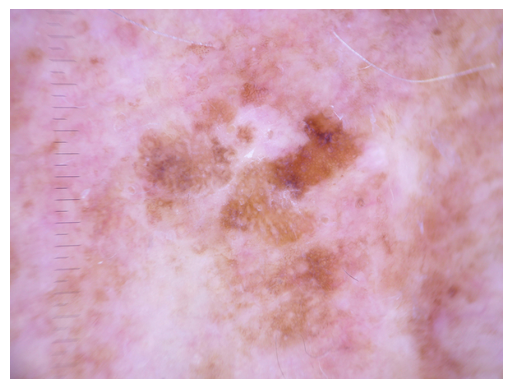

Image 2
GLOBAL : The image shows an image of a lesion on a person's skin is shown with a ruler in the background.
ROI    : The image shows a close-up image of a pink lesion on a person's skin. The lesion has a symmetrical shape and is pink in color.
FOCUSED: The image shows an image of a lesion is shown through a magnifying glass, with a ruler in the background. The lesion has a pinkish color and is symmetrical.
--------------------------------------------------------------------------------


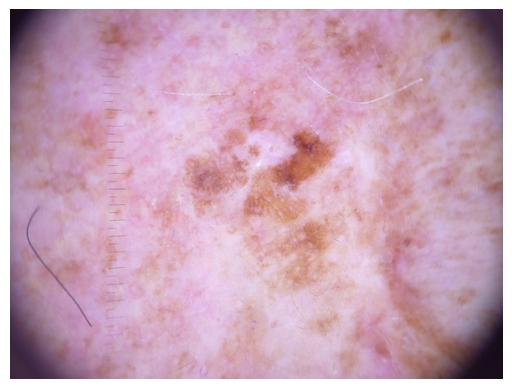

Image 3
GLOBAL : The image shows a close up image of a person's skin shows a pink lesion with brown spots.
ROI    : The image shows a close-up of a pink lesion on a person's face shows symmetry, border, color distribution, diameter in millimeters if visible, and texture.
FOCUSED: The image shows a close up image of a lesion on a person's face shows a reddish-brown spot with a pink tinge.
--------------------------------------------------------------------------------


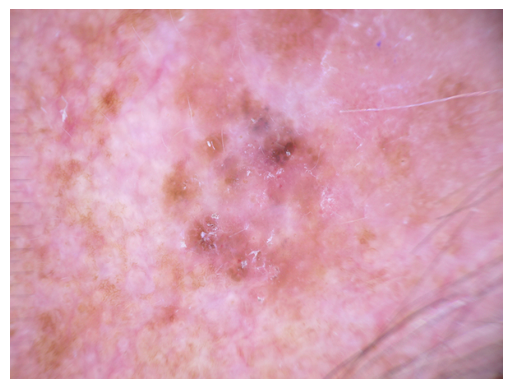

Image 4
GLOBAL : The image shows a person has a lesion on their skin that is pink in color.
ROI    : The image shows a close-up image of a pink lesion on a person's skin. The lesion has a symmetrical shape and is pink in color. It is surrounded by a white border.
FOCUSED: The image shows a person has a lesion on their head that is brown in color.
--------------------------------------------------------------------------------


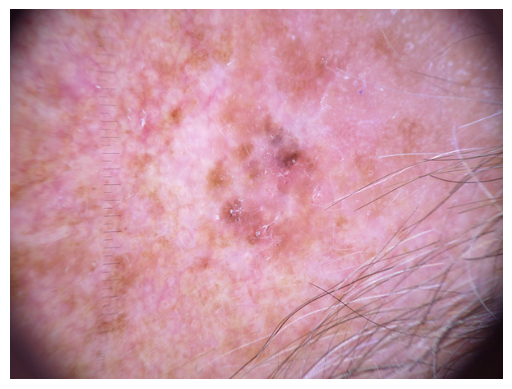

Image 5
GLOBAL : The image shows a person has a lesion on their ear that is brown in color.
ROI    : The image shows a close-up image of a pink lesion on a cat's ear. The lesion is pink in color and has a symmetrical border.
FOCUSED: The image shows a person has a lesion on their ear that is pink in color.
--------------------------------------------------------------------------------


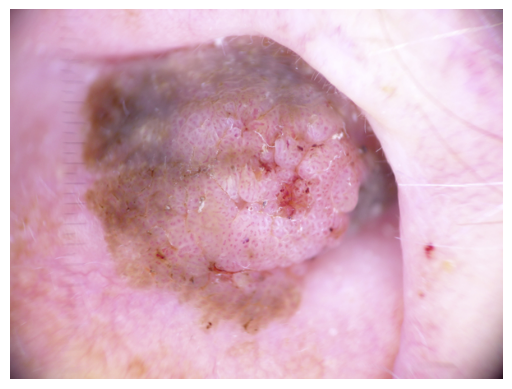

Image 6
GLOBAL : The image shows a person's ear is covered in a brown, reddish-brown rash.
ROI    : The image shows a close-up image of a pink lesion on a person's skin. The lesion is symmetrical, bordered, and has a blue color.
FOCUSED: The image shows a person's ear is covered in a brown, reddish-brown lesion.
--------------------------------------------------------------------------------


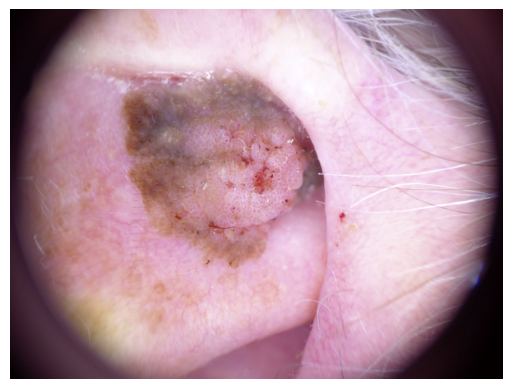

Image 7
GLOBAL : The image shows a close-up image of a lesion on a person's skin shows a pink spot with a white border.
ROI    : The image shows a close-up image of a lesion on a person's skin shows a pink spot with a white border.
FOCUSED: The image shows a close up of a lesion on a person's skin with a bright light shining on it.
--------------------------------------------------------------------------------


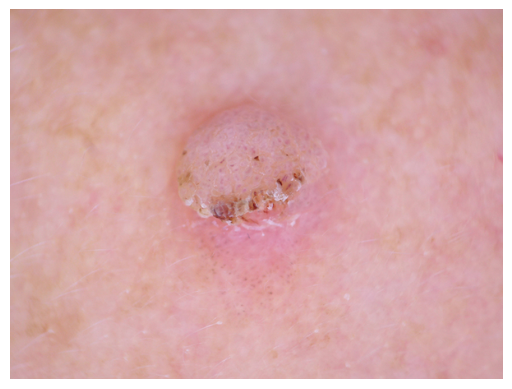

Image 8
GLOBAL : The image shows a person has a small red spot on their skin, which is being measured with a ruler.
ROI    : The image shows a person has a small lesion on their skin, and a ruler is used to measure the size of the lesion.
FOCUSED: The image shows a photo of a lesion on a person's skin shows symmetry, border, color distribution, diameter in millimeters if visible, and texture.
--------------------------------------------------------------------------------


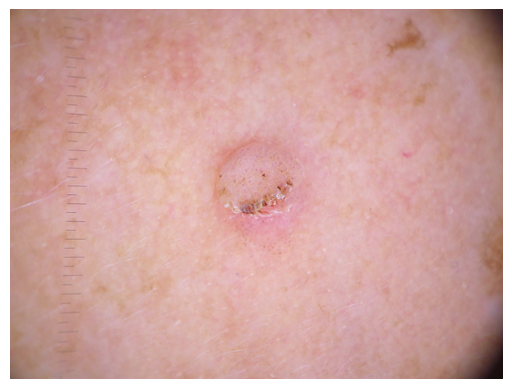

Image 9
GLOBAL : The image shows a pink lesion on a person's skin is being measured with a ruler
ROI    : The image shows a pink lesion on a person's skin is being measured with a ruler
FOCUSED: The image shows a lesion on a person's skin is being measured using a ruler.
--------------------------------------------------------------------------------


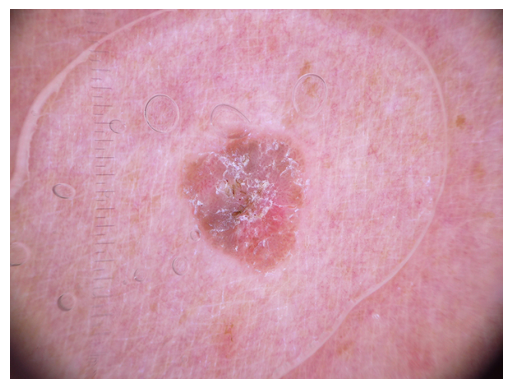

Image 10
GLOBAL : The image shows a close-up image of a pink lesion on a person's skin shows symmetry, border, color distribution, diameter in millimeters if visible, and texture.
ROI    : The image shows a lesion on a person's skin is pink and has a reddish-brown color.
FOCUSED: The image shows an image of a lesion on a person's skin with water droplets on it.
--------------------------------------------------------------------------------


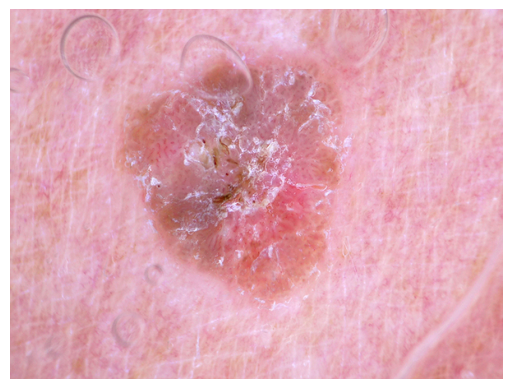

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

for i in range(10):
    p = df['image_path'].iloc[i]
    o = describe_with_cam(p, class_idx=None, prompt=DERM_PROMPT)

    print(f"Image {i+1}")
    print("GLOBAL :", o['cap_global'])
    print("ROI    :", o['cap_roi'])
    print("FOCUSED:", o['cap_focused'])
    print("-" * 80)

    img = Image.open(p)
    plt.imshow(img)
    plt.axis("off")
    plt.show()


In [ ]:
p = df['image_path'].iloc[2]
o = describe_with_cam(p, class_idx=None, prompt=DERM_PROMPT)
print("GLOBAL :", o['cap_global'])
print("ROI    :", o['cap_roi'])
print("FOCUSED:", o['cap_focused'])

GLOBAL : The image shows a visible skin lesion with asymmetry, border regularity, color variation, and surface texture. The lesion is located on the left side of a person's face, and it is surrounded by a pinkish-brown patch. The patch is irregularly shaped
ROI    : The image shows a visible skin lesion with asymmetry, border regularity, color variation, and surface texture. The lesion is located on the left side of the person's face, and it is surrounded by a pinkish-brown patch of skin. The patch is irregularly
FOCUSED: The image shows a visible skin lesion with asymmetry, border regularity, color variation, and surface texture. The lesion is located on the left side of the person's face, and it is surrounded by a reddish-brown patch of skin. The patch appears to be


In [ ]:
p = df['image_path'].iloc[124]
o = describe_with_cam(p, class_idx=None, prompt=DERM_PROMPT)
print("GLOBAL :", o['cap_global'])
print("ROI    :", o['cap_roi'])
print("FOCUSED:", o['cap_focused'])

GLOBAL : The image shows a visible skin lesion with asymmetry, border regularity, color variation, and surface texture.
ROI    : The image shows a visible skin lesion with asymmetry, border regularity, color variation, and surface texture. The lesion is located on the left side of the body, and it is surrounded by a pinkish-brown area. This lesion may be a result of a
FOCUSED: The image shows a visible skin lesion with asymmetry, border regularity, color variation, and surface texture.


In [ ]:
p = df['image_path'].iloc[2323]
o = describe_with_cam(p, class_idx=None, prompt=DERM_PROMPT)
print("GLOBAL :", o['cap_global'])
print("ROI    :", o['cap_roi'])
print("FOCUSED:", o['cap_focused'])

GLOBAL : The image shows a visible skin lesion on a person's arm. The lesion is pink in color and is asymmetrical, with irregular borders and a reddish-brown spot in the middle of the lesion. It may be a mole, a wart
ROI    : The image shows a visible skin lesion on a person's skin. The lesion is brown in color and is asymmetrical, with irregular borders and a reddish-brown center. It may be a mole, a wart, or a tumor. The
FOCUSED: The image shows a visible skin lesion on a person's abdomen. The lesion is asymmetric, with irregular borders and a reddish-brown color. It may be a mole, a wart, or a cyst, and may be caused by a


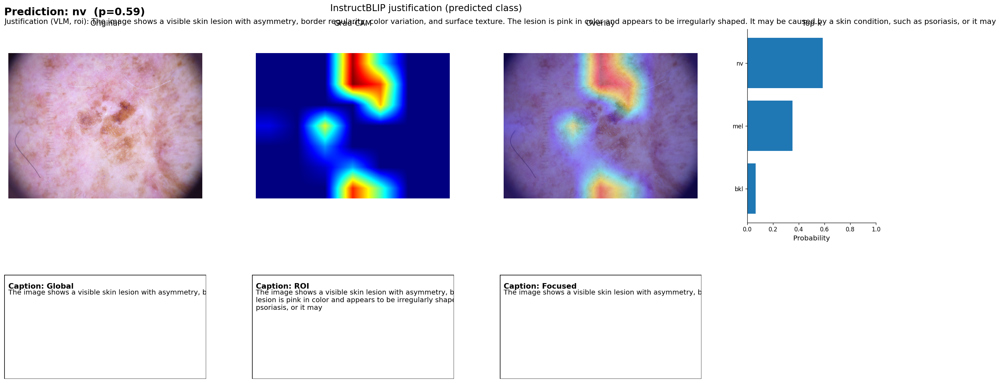

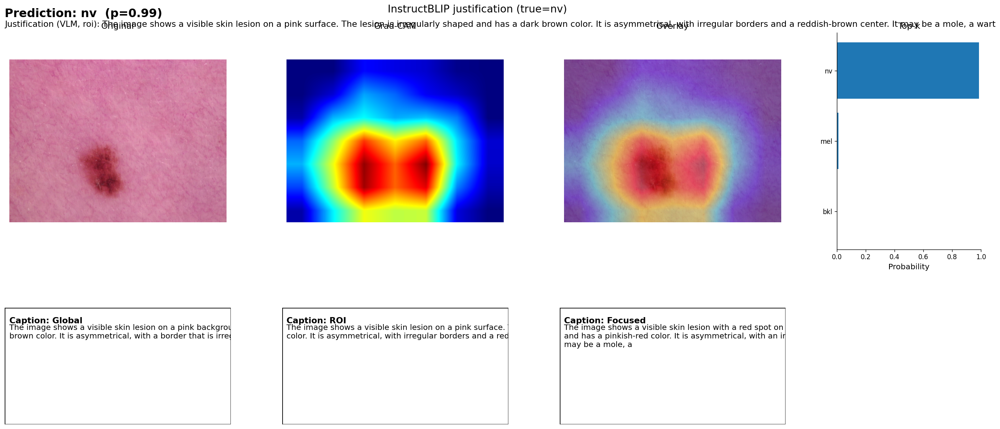

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np, textwrap, torch.nn.functional as F
from PIL import Image

def _wrap(s, width):
    return textwrap.fill(s, width=width, break_long_words=False, replace_whitespace=False)

def _caption_box(ax, title, text, wrap_chars=110):
    ax.set_axis_off()
    ax.set_xlim(0,1); ax.set_ylim(0,1)

    ax.add_patch(patches.Rectangle((0,0), 1, 1, fill=False, linewidth=1.5))
    ax.text(0.02, 0.92, title, fontsize=13, weight="bold", va="top")
    ax.text(0.02, 0.86, _wrap(text, wrap_chars), fontsize=12, va="top", clip_on=True)

def show_case_with_justification_wide(img_path, class_idx=None, topk=3,
                                      use_caption="cap_roi", title=None,
                                      wrap_chars=110):
    pil = Image.open(img_path).convert("RGB")
    x = preprocess(pil).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        logits = model(x)
        probs = F.softmax(logits, dim=1).cpu().numpy()[0]
    order = np.argsort(probs)[::-1][:topk]
    pred_label = idx_to_class[order[0]]
    pred_prob  = float(probs[order[0]])

    out = describe_with_cam(img_path, class_idx=class_idx)
    cam = out["cam"]
    overlay, heatmap, _, _ = generate_gradcam(img_path, class_idx=class_idx, return_heatmap=True)

    fig = plt.figure(figsize=(22, 10), dpi=120)

    gs = fig.add_gridspec(
        2, 4,
        height_ratios=[2.6, 1.4],
        width_ratios=[1.1, 1.1, 1.1, 0.7]
    )
    plt.subplots_adjust(left=0.04, right=0.99, top=0.92, bottom=0.08, wspace=0.25, hspace=0.35)

    header_ax = fig.add_axes([0.04, 0.93, 0.92, 0.05])
    header_ax.axis("off")
    header_ax.text(0.0, 0.6, f"Prediction: {pred_label}  (p={pred_prob:.2f})",
                   fontsize=18, weight="bold", va="center")
    header_ax.text(0.0, 0.05, f"Justification (VLM, {use_caption.replace('cap_','')}): {out[use_caption]}",
                   fontsize=13)

    ax0 = fig.add_subplot(gs[0,0]); ax0.imshow(pil);     ax0.axis("off"); ax0.set_title("Original", fontsize=13)
    ax0.set_box_aspect(1)

    ax1 = fig.add_subplot(gs[0,1]); ax1.imshow(heatmap); ax1.axis("off"); ax1.set_title("Grad‑CAM", fontsize=13)
    ax1.set_box_aspect(1)

    ax2 = fig.add_subplot(gs[0,2]); ax2.imshow(overlay); ax2.axis("off"); ax2.set_title("Overlay", fontsize=13)
    ax2.set_box_aspect(1)

    ax3 = fig.add_subplot(gs[0,3])
    ax3.barh([idx_to_class[i] for i in order[::-1]], [probs[i] for i in order[::-1]])
    ax3.set_xlim(0, 1.0)
    ax3.set_xlabel("Probability", fontsize=12)
    ax3.set_title("Top‑k", fontsize=13)
    for spine in ["top","right"]:
        ax3.spines[spine].set_visible(False)

    ax4 = fig.add_subplot(gs[1,0]); _caption_box(ax4, "Caption: Global",  out["cap_global"],  wrap_chars)
    ax5 = fig.add_subplot(gs[1,1]); _caption_box(ax5, "Caption: ROI",     out["cap_roi"],     wrap_chars)
    ax6 = fig.add_subplot(gs[1,2]); _caption_box(ax6, "Caption: Focused", out["cap_focused"], wrap_chars)

    ax7 = fig.add_subplot(gs[1,3]); ax7.axis("off")

    if title:
        fig.suptitle(title, fontsize=16, y=0.98)

    plt.show()

img_path = df["image_path"].iloc[1]
show_case_with_justification_wide(
    img_path,
    class_idx=None,
    use_caption="cap_roi",
    title="InstructBLIP justification (predicted class)",
    wrap_chars=115
)

row = df.sample(1, random_state=3).iloc[0]
show_case_with_justification_wide(
    row["image_path"],
    class_idx=class_to_idx[row["label"]],
    use_caption="cap_roi",
    title=f"InstructBLIP justification (true={row['label']})"
)


In [ ]:
import pandas as pd
from tqdm import tqdm
from pathlib import Path

N_SAMPLE = 200
which_guidance = True

def batch_caption(df_all, out_csv="captions_cache.csv", overwrite=False):
    out_csv = Path(out_csv)
    if out_csv.exists() and not overwrite:
        print(f"Loading cached captions from {out_csv}")
        return pd.read_csv(out_csv)

    df_use = df_all.sample(N_SAMPLE, random_state=0).reset_index(drop=True) if N_SAMPLE else df_all.reset_index(drop=True)
    rows = []
    for i, r in tqdm(df_use.iterrows(), total=len(df_use)):
        img_path = r["image_path"]
        cls_idx = class_to_idx[r["label"]] if which_guidance else None
        try:
            out = describe_with_cam(img_path, class_idx=cls_idx)
            rows.append({
                "image_path": img_path,
                "label": r["label"],
                "cap_global": out["cap_global"],
                "cap_roi": out["cap_roi"],
                "cap_focused": out["cap_focused"],
            })
        except Exception as e:
            rows.append({
                "image_path": img_path,
                "label": r["label"],
                "cap_global": f"ERROR: {e}",
                "cap_roi": f"ERROR: {e}",
                "cap_focused": f"ERROR: {e}",
            })
    df_caps = pd.DataFrame(rows)
    df_caps.to_csv(out_csv, index=False)
    print(f"Saved captions to {out_csv}")
    return df_caps

df_caps = batch_caption(df, out_csv="captions_cache.csv", overwrite=True)
len(df_caps), df_caps.head(2)


100%|██████████| 200/200 [30:55<00:00,  9.28s/it]

Saved captions to captions_cache.csv


(200,
                                           image_path label  \
 0  skin_cancer_dataset/ham10000_images_part_1/ISI...   mel   
 1  skin_cancer_dataset/ham10000_images_part_2/ISI...    nv   
 
                                           cap_global  \
 0  The image shows a visible skin lesion on the l...   
 1  The image shows a visible skin lesion with a r...   
 
                                              cap_roi  \
 0  The image shows a brown skin lesion on a perso...   
 1  The image shows a visible skin lesion on a per...   
 
                                          cap_focused  
 0  The image shows a visible skin lesion with asy...  
 1  The image shows a visible skin lesion with a r...  )

Evaluation based on: cap_roi
              precision    recall  f1-score   support

         mel      0.042     0.040     0.041        25
         bkl      0.000     0.000     0.000        37
          nv      0.659     0.841     0.739       138

    accuracy                          0.585       200
   macro avg      0.234     0.294     0.260       200
weighted avg      0.460     0.585     0.515       200



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


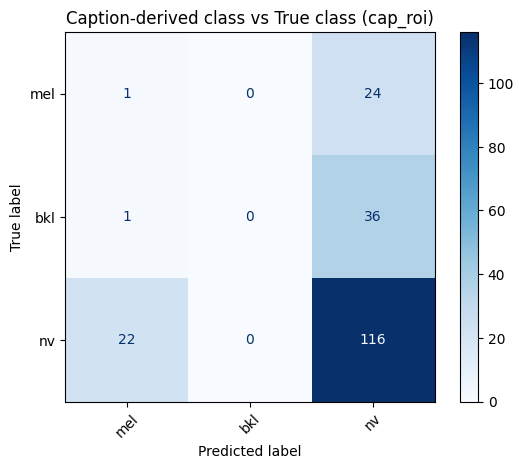

In [ ]:
import re
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

LEXICON = {
    "mel": ["asymmetric", "irregular border", "blurred border", "variegated", "multiple colors", "dark patch", "streaks"],
    "bkl": ["waxy", "stuck-on", "sharply demarcated", "well-defined", "keratotic", "crusty", "scaly"],
    "nv" : ["uniform", "symmetric", "regular border", "homogeneous", "even color", "round", "oval"]
}
labels_order = ["mel","bkl","nv"]

def caption_to_scores(text: str):
    t = text.lower()
    scores = {c:0 for c in LEXICON}
    for c, words in LEXICON.items():
        for w in words:
            if re.search(r"\b"+re.escape(w)+r"\b", t):
                scores[c] += 1
    return scores

def predict_from_caption(text: str):
    if text.startswith("ERROR"):
        return "nv"
    scores = caption_to_scores(text)
    return max(scores.items(), key=lambda kv: (kv[1], kv[0]))[0]

WHICH = "cap_roi"

df_eval = df_caps.copy()
df_eval["cap_pred"] = df_eval[WHICH].apply(predict_from_caption)

print(f"Evaluation based on: {WHICH}")
print(classification_report(df_eval["label"], df_eval["cap_pred"], labels=labels_order, digits=3))

cm = confusion_matrix(df_eval["label"], df_eval["cap_pred"], labels=labels_order)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels_order)
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title(f"Caption-derived class vs True class ({WHICH})")
plt.show()


In [ ]:
miss = df_eval[df_eval["label"] != df_eval["cap_pred"]].copy()
print(f"Mismatches: {len(miss)} / {len(df_eval)}")
miss.head(8)[["image_path","label","cap_pred",WHICH]]


Mismatches: 83 / 200


,image_path,label,cap_pred,cap_roi
5,skin_cancer_dataset/ham10000_images_part_1/ISI...,mel,nv,The image shows a visible skin lesion on a per...
8,skin_cancer_dataset/ham10000_images_part_1/ISI...,bkl,nv,The image shows a visible skin lesion with asy...
9,skin_cancer_dataset/ham10000_images_part_2/ISI...,mel,nv,The image shows a visible skin lesion with asy...
14,skin_cancer_dataset/ham10000_images_part_1/ISI...,bkl,nv,The image shows a visible skin lesion with asy...
16,skin_cancer_dataset/ham10000_images_part_2/ISI...,nv,mel,The image shows a brown lesion on a person's s...
18,skin_cancer_dataset/ham10000_images_part_1/ISI...,mel,nv,The image shows a visible skin lesion with a p...
20,skin_cancer_dataset/ham10000_images_part_2/ISI...,mel,nv,The image shows a visible skin lesion with asy...
23,skin_cancer_dataset/ham10000_images_part_2/ISI...,mel,nv,The image shows a visible skin lesion on a per...
